Feature shape: (1000, 3)
Cluster centers: [[0.79552822 0.81987521 0.83271125]
 [0.27297704 0.32680637 0.33542626]
 [0.57158731 0.51109189 0.43180778]
 [0.38141133 0.38600465 0.44043311]
 [0.1306679  0.20139331 0.28205825]
 [0.51824614 0.49829773 0.51677756]
 [0.28690155 0.49554369 0.41339404]
 [0.51978254 0.41566203 0.33972561]
 [0.19646064 0.16906042 0.32295303]
 [0.71358158 0.74873639 0.77566729]
 [0.54763557 0.60863328 0.66304314]
 [0.33744038 0.43129842 0.60024911]
 [0.38354311 0.4483308  0.47952282]
 [0.32211421 0.36881376 0.45427888]
 [0.48068244 0.46146738 0.44744373]
 [0.61699169 0.59042053 0.55088615]
 [0.2264871  0.26830501 0.35024739]
 [0.42872786 0.5203592  0.5230363 ]
 [0.14851659 0.11962304 0.44366791]
 [0.3928153  0.34043656 0.30006391]
 [0.10638682 0.09168896 0.25591095]
 [0.44046935 0.42661368 0.40434236]
 [0.23638374 0.26112689 0.2566425 ]
 [0.41476544 0.38101661 0.34991964]
 [0.29636696 0.31795428 0.39312971]
 [0.16282918 0.21768005 0.39457001]
 [0.33656128 0.3106589

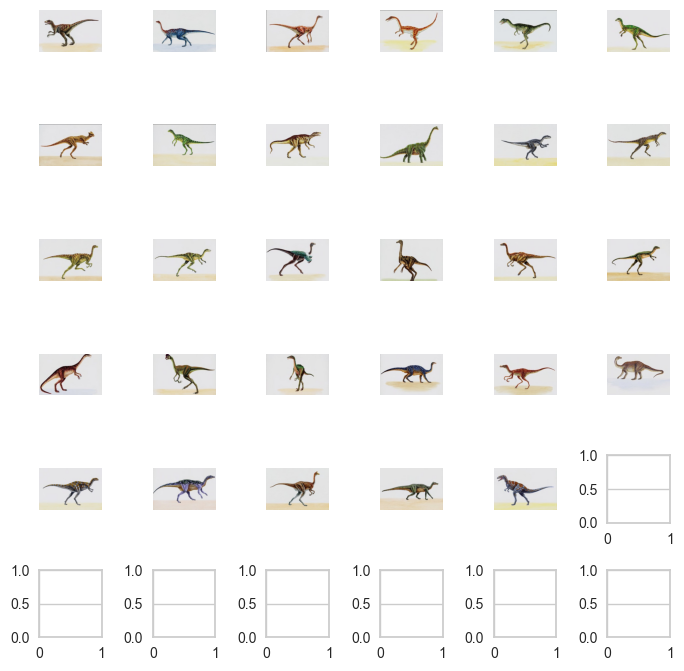

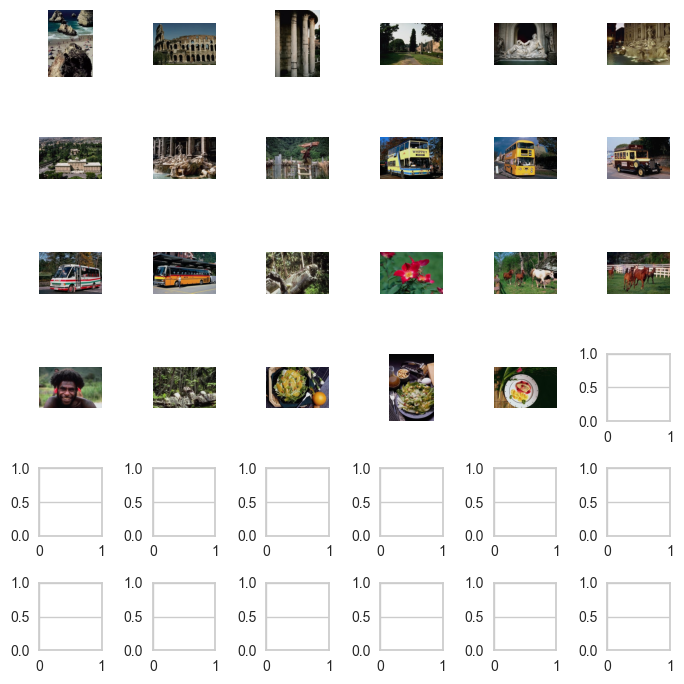

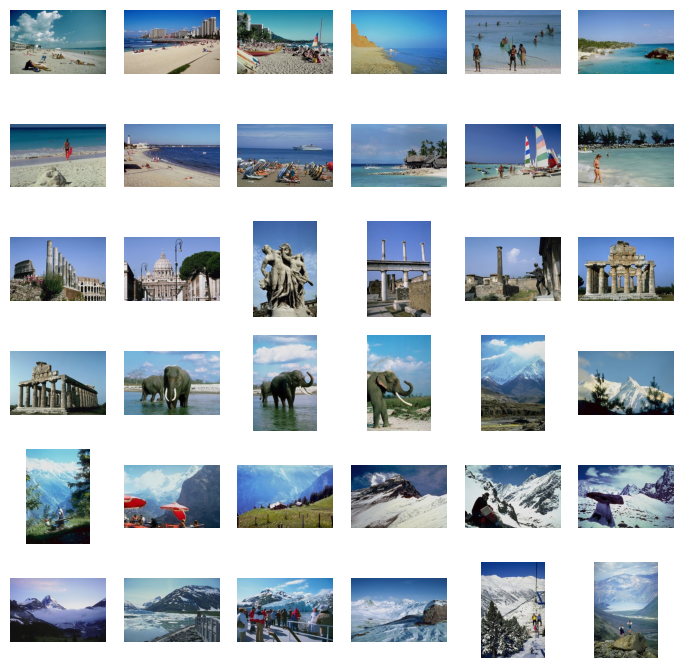

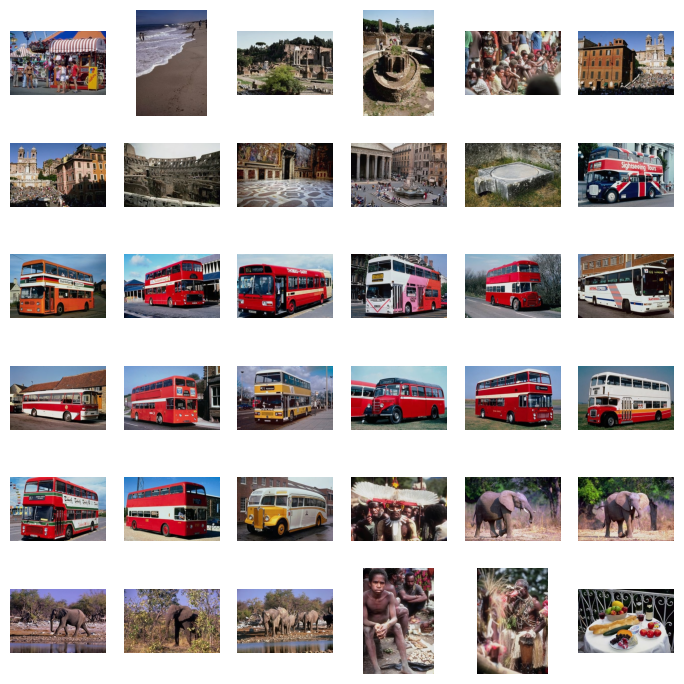

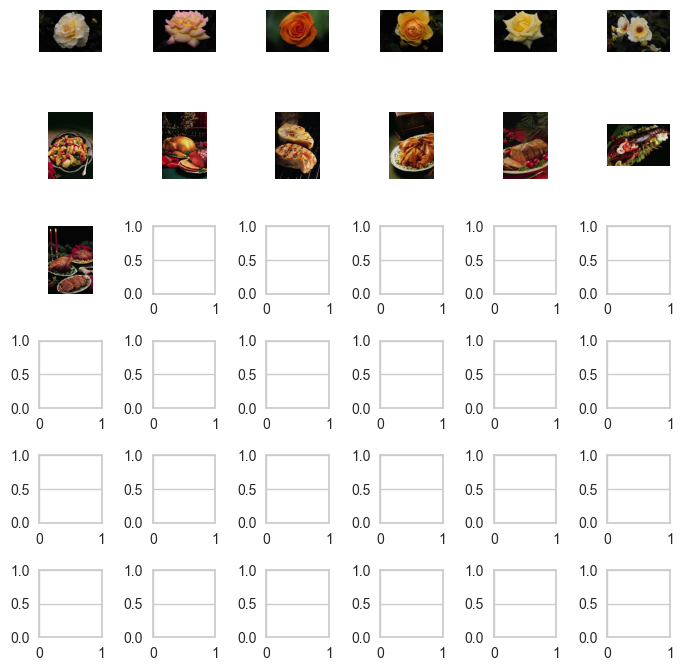

...

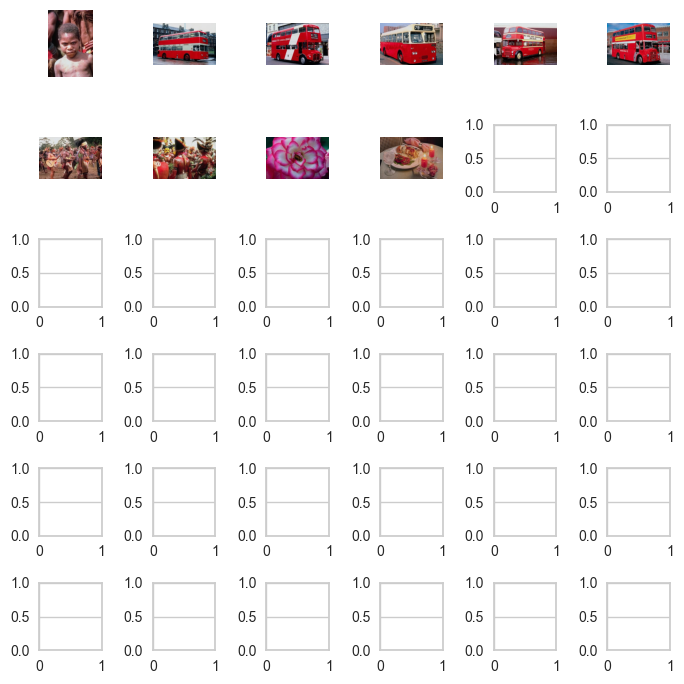

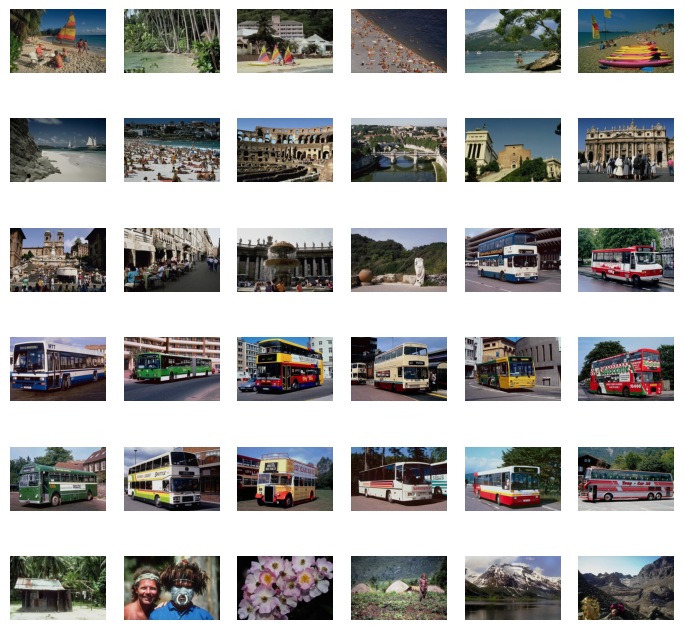

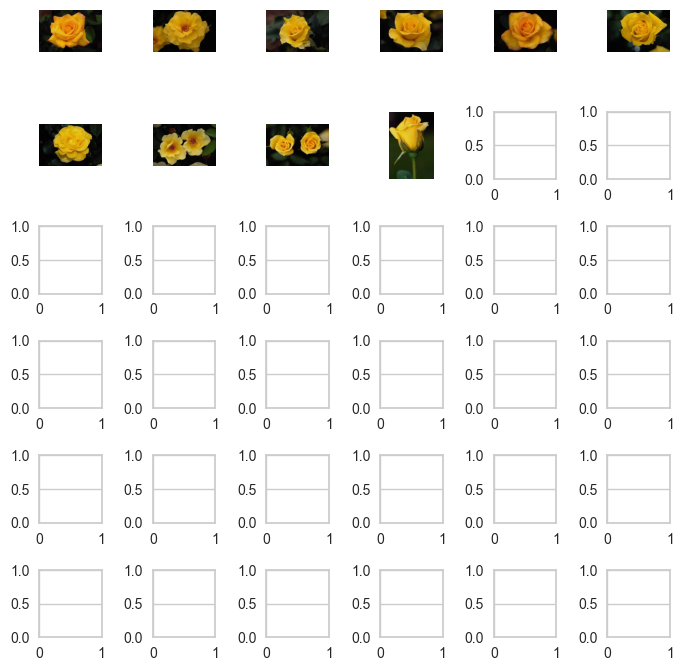

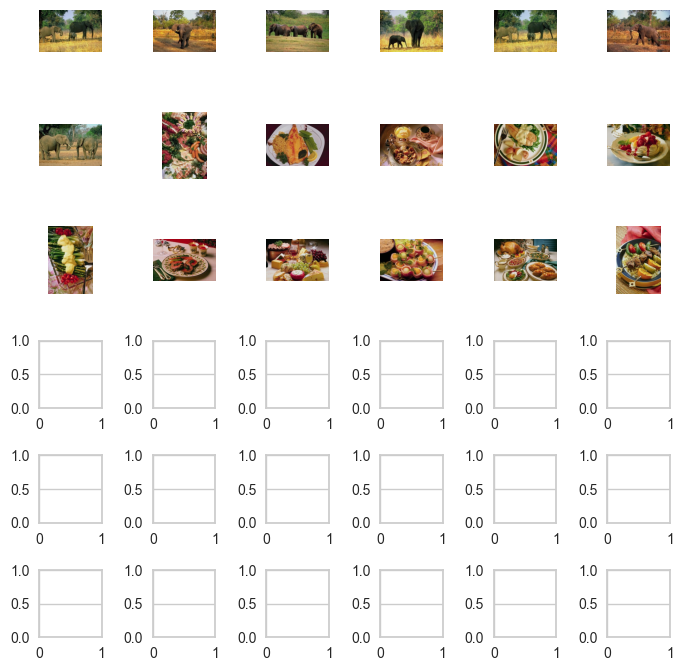

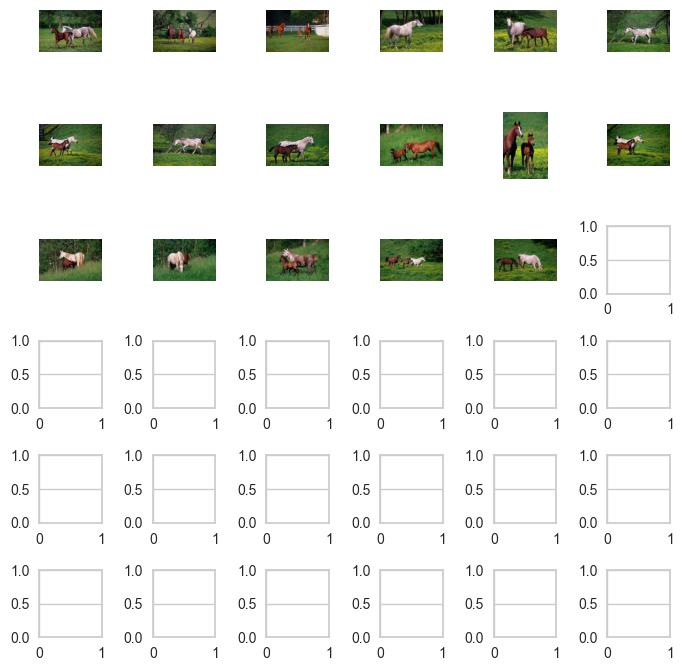

In [5]:
import cv2
import os
import numpy as np
import pickle
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from yellowbrick.cluster import SilhouetteVisualizer

data_path = r'D:\test_py\du lieu hinh\du lieu hinh\A-Test'

def get_feature(img):
    if img is None:
        return None
    intensity = img.sum(axis=1)
    intensity = intensity.sum(axis=0) / (255 * img.shape[0] * img.shape[1])
    return intensity

def create_pickle(data_path=data_path):
    X = []
    L = []
    for file in os.listdir(data_path):
        img_path = os.path.join(data_path, file)
        
        if file.lower().endswith(('.jpg', '.jpeg', '.png')):
            img = cv2.imread(img_path)
            c_x = get_feature(img)
            if c_x is not None:  
                X.append(c_x)
                L.append(file)

    X = np.array(X)
    L = np.array(L)

    with open('data.pickle', 'wb') as handle:
        pickle.dump(X, handle, protocol=pickle.HIGHEST_PROTOCOL)
    with open('label.pickle', 'wb') as handle:
        pickle.dump(L, handle, protocol=pickle.HIGHEST_PROTOCOL)

    print("Pickle files created successfully!")
    
    return X, L

def load_data():
    try:
        with open('data.pickle', 'rb') as handle:
            X = pickle.load(handle)
        with open('label.pickle', 'rb') as handle:
            L = pickle.load(handle)
        return X, L
    except (FileNotFoundError, EOFError):
        print("Pickle files not found or corrupted. Creating new data.")
        return create_pickle()

def main():
    X, L = load_data()
    print(f"Feature shape: {X.shape}")

    # cluster_range = list(range(2, 61))  

    # for k in cluster_range:
    #     km = KMeans(n_clusters=k, init='k-means++', n_init=10, max_iter=100, random_state=42)
        
    #     plt.figure(figsize=(10, 6))
    #     visualizer = SilhouetteVisualizer(km, colors='yellowbrick')
    #     visualizer.fit(X)

    #     plt.title(f'Silhouette Visualization for {k} Clusters')
    #     plt.tight_layout()
    #     plt.show()

    n_clusters = 41
    kmeans = KMeans(n_clusters=n_clusters, random_state=42).fit(X)

    print("Cluster centers:", kmeans.cluster_centers_)

    n_row, n_col = 6, 6
    for i in range(n_clusters):
        _, axs = plt.subplots(n_row, n_col, figsize=(7, 7))
        axs = axs.flatten()
        images = L[kmeans.labels_ == i][:36]
        for img, ax in zip(images, axs):
            img_path = os.path.join(data_path, img)
            img_data = mpimg.imread(img_path)
            ax.imshow(img_data)
            ax.axis('off')
        plt.tight_layout()
        plt.show()

if __name__ == "__main__":
    main()